<a href="https://colab.research.google.com/github/SakshiPathak01/Sustainable-Energy-Consumption-Analysis-Through-Data-Driven-Insights/blob/main/Sustainable_Energy_Consumption.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

##Global Sustainable Energy on World Map

data description

Uncover this comprehensive dataset showcasing sustainable energy indicators and other useful factors across all countries from 2000 to 2020. Dive into vital aspects such as electricity access, renewable energy, carbon emissions, energy intensity, Financial flows, and economic growth. Compare nations, track progress towards Sustainable Development Goal 7, and gain profound insights into global energy consumption patterns over time.



In [ ]:
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
df = pd.read_csv("/content/global-data-on-sustainable-energy (1) (1).csv")

In [ ]:
df.columns.tolist()

['Entity',
 'Year',
 'Access to electricity (% of population)',
 'Access to clean fuels for cooking',
 'Renewable-electricity-generating-capacity-per-capita',
 'Financial flows to developing countries (US $)',
 'Renewable energy share in the total final energy consumption (%)',
 'Electricity from fossil fuels (TWh)',
 'Electricity from nuclear (TWh)',
 'Electricity from renewables (TWh)',
 'Low-carbon electricity (% electricity)',
 'Primary energy consumption per capita (kWh/person)',
 'Energy intensity level of primary energy (MJ/$2017 PPP GDP)',
 'Value_co2_emissions_kt_by_country',
 'Renewables (% equivalent primary energy)',
 'gdp_growth',
 'gdp_per_capita',
 'Density\\n(P/Km2)',
 'Land Area(Km2)',
 'Latitude',
 'Longitude']

In [ ]:
# Function to plot features on world map
def plot_world_map(column_name):
    fig = go.Figure()
    for year in range(2000, 2021):
        # Filter the data for the current year
        filtered_df = df[df['Year'] == year]

        # Create a choropleth trace for the current year
        trace = go.Choropleth(
            locations=filtered_df['Entity'],
            z=filtered_df[column_name],
            locationmode='country names',
            colorscale='Electric',  # Use a different color scale for better contrast
            colorbar=dict(title=column_name),
            zmin=df[column_name].min(),
            zmax=df[column_name].max(),
            visible=False  # Set the trace to invisible initially
        )

        # Add the trace to the figure
        fig.add_trace(trace)

    # Set the first trace to visible
    fig.data[0].visible = True

    # Create animation steps
    steps = []
    for i in range(len(fig.data)):
        step = dict(
            method='update',
            args=[{'visible': [False] * len(fig.data)},  # Set all traces to invisible
                  {'title_text': f'{column_name} Map - {2000 + i}', 'frame': {'duration': 1000, 'redraw': True}}],
            label=str(2000 + i)  # Set the label for each step
        )
        step['args'][0]['visible'][i] = True  # Set the current trace to visible
        steps.append(step)

    # Create the slider
    sliders = [dict(
        active=0,
        steps=steps,
        currentvalue={"prefix": "Year: ", "font": {"size": 14}},  # Increase font size for slider label
    )]

    # Update the layout of the figure with increased size and change the template
    fig.update_layout(
        title_text=f'{column_name} Map with slider',  # Set the initial title
        title_font_size=24,  # Increase title font size
        title_x=0.5,  # Center the title
        geo=dict(
            showframe=True,
            showcoastlines=False,
            projection_type='natural earth'
        ),
        sliders=sliders,
        height=500,  # Set the height of the figure in pixels
        width=1000,  # Set the width of the figure in pixels
        font=dict(family='Arial', size=12),  # Customize font family and size for the whole figure
        margin=dict(t=80, l=50, r=50, b=50),  # Add margin for better layout spacing
        # Change the template to 'plotly_dark'
    )

    # Show the figure
    fig.show()

In [ ]:
select_col = [
 'Access to electricity (% of population)',
 'Access to clean fuels for cooking',
 'Low-carbon electricity (% electricity)',
]

In [ ]:
for i in select_col:
    column_name = i
    print(column_name)
    plot_world_map(column_name)

Access to electricity (% of population)


Access to clean fuels for cooking


Low-carbon electricity (% electricity)


Our complete Energy dataset is a collection of key metrics maintained by Our World in Data. It is updated regularly and includes data on energy consumption (primary energy, per capita, and growth rates), energy mix, electricity mix and other relevant metrics.

#TIME SERIES

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, f1_score

# Set floating point precision option for pandas
pd.set_option('display.float_format', lambda x: '%.4f' % x)

# Import seaborn library and set context and style
import seaborn as sns
sns.set_context("paper", font_scale=1.3)
sns.set_style('white')

# Import warnings and set filter to ignore warnings
import warnings
warnings.filterwarnings('ignore')

# Import time library
from time import time

# Import matplotlib ticker and scipy stats
import matplotlib.ticker as tkr
from scipy import stats

# Import statistical tools for time series analysis
from statsmodels.tsa.stattools import adfuller

# Import preprocessing from sklearn
from sklearn import preprocessing

# Import partial autocorrelation function from statsmodels
from statsmodels.tsa.stattools import pacf

# Enable inline plotting in Jupyter Notebook
%matplotlib inline

# Import math library
import math

# Import necessary functions from keras
import keras
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from keras.layers import Dropout
from keras.layers import *

# Import MinMaxScaler from sklearn
from sklearn.preprocessing import MinMaxScaler

# Import mean squared error and mean absolute error from sklearn
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error

# Import early stopping from keras callbacks
from keras.callbacks import EarlyStopping

In [ ]:
data = pd.read_csv('block_0.csv')

# Print the number of rows and columns in the data
print('Number of rows and columns:', data.shape)

# Display the first 5 rows of the data
data.head(5)

Number of rows and columns: (25574, 9)


,LCLid,day,energy_median,energy_mean,energy_max,energy_count,energy_std,energy_sum,energy_min
0,MAC000002,2012-10-12,0.1385,0.1543,0.8860,46,0.1960,7.0980,0.0000
1,MAC000002,2012-10-13,0.1800,0.2310,0.9330,48,0.1923,11.0870,0.0760
2,MAC000002,2012-10-14,0.1580,0.2755,1.0850,48,0.2746,13.2230,0.0700
3,MAC000002,2012-10-15,0.1310,0.2137,1.1640,48,0.2245,10.2570,0.0700
4,MAC000002,2012-10-16,0.1450,0.2035,0.9910,48,0.1841,9.7690,0.0870


<Axes: xlabel='day', ylabel='energy_mean'>

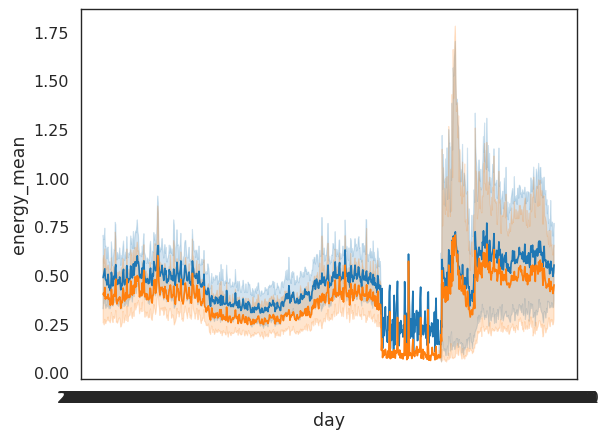

In [ ]:
# @title Energy Mean vs Median over Time

sns.lineplot(data=data, x="day", y="energy_mean")
sns.lineplot(data=data, x="day", y="energy_median")

<Axes: xlabel='day', ylabel='energy_median'>

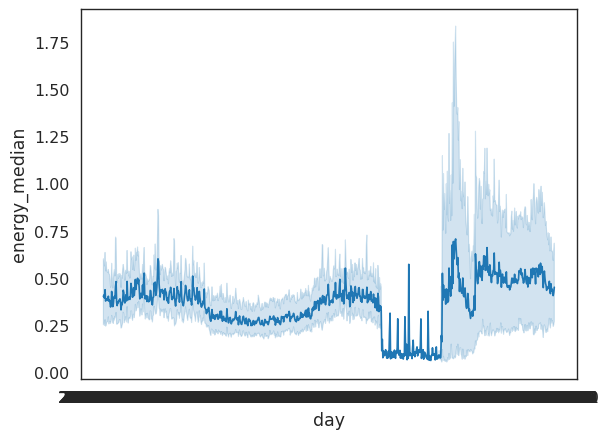

In [ ]:
# @title Median Energy Consumption Over Time

sns.lineplot(data=data, x="day", y="energy_median")

In [ ]:
data['date_time'] = pd.to_datetime(data['day'])

# Convert the 'Global_active_power' column to numeric format
# and remove any rows with NaN values
data['energy_sum'] = pd.to_numeric(data['energy_sum'], errors='coerce')
data = data.dropna(subset=['energy_sum'])

# Create new columns for year, quarter, month, and day
data['year'] = data['date_time'].apply(lambda x: x.year)
data['quarter'] = data['date_time'].apply(lambda x: x.quarter)
data['month'] = data['date_time'].apply(lambda x: x.month)
data['day'] = data['date_time'].apply(lambda x: x.day)

# Keep only the columns 'date_time', 'Global_active_power', 'year', 'quarter', 'month', 'day'
data = data.loc[:,['date_time','energy_sum', 'year','quarter','month','day']]

# Sort the data by date_time in ascending order
data.sort_values('date_time', inplace=True, ascending=True)

# Reset the index of the data
data = data.reset_index(drop=True)

# Create a new column 'weekday' that indicates if the day is a weekday (1) or weekend (0)
data['weekday'] = data['date_time'].apply(lambda x: x.weekday() < 5).astype(int)

In [ ]:
# Print the number of rows and columns in the data
print('Number of rows and columns:', data.shape)

# Print the minimum and maximum date_time values
print('Minimum date_time:', data.date_time.min())
print('Maximum date_time:', data.date_time.max())

# Display the last 5 rows of the data
data.tail(5)

Number of rows and columns: (25574, 7)
Minimum date_time: 2011-12-03 00:00:00
Maximum date_time: 2014-02-28 00:00:00


,date_time,energy_sum,year,quarter,month,day,weekday
25569,2014-02-28,0.0980,2014,1,2,28,1
25570,2014-02-28,0.2800,2014,1,2,28,1
25571,2014-02-28,0.2120,2014,1,2,28,1
25572,2014-02-28,0.1450,2014,1,2,28,1
25573,2014-02-28,0.0880,2014,1,2,28,1


from matplotlib import pyplot as plt
_df_0['energy_sum'].plot(kind='hist', bins=20, title='energy_sum')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['date_time']
  ys = series['energy_sum']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_1.sort_values('date_time', ascending=True)
_plot_series(df_sorted, '')
sns.despine(fig=fig, ax=ax)
plt.xlabel('date_time')
_ = plt.ylabel('energy_sum')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  counted = (series['date_time']
                .value_counts()
              .reset_index(name='counts')
              .rename({'index': 'date_time'}, axis=1)
              .sort_values('date_time', ascending=True))
  xs = counted['date_time']
  ys = counted['counts']
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_2.sort_values('date_time', ascending=True)
_plot_series(df_sorted, '')
sns.despine(fig=fig, ax=ax)
plt.xlabel('date_time')
_ = plt.ylabel('count()')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['year']
  ys = series['energy_sum']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_3.sort_values('year', ascending=True)
_plot_series(df_sorted, '')
sns.despine(fig=fig, ax=ax)
plt.xlabel('year')
_ = plt.ylabel('energy_sum')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  counted = (series['year']
                .value_counts()
              .reset_index(name='counts')
              .rename({'index': 'year'}, axis=1)
              .sort_values('year', ascending=True))
  xs = counted['year']
  ys = counted['counts']
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_4.sort_values('year', ascending=True)
_plot_series(df_sorted, '')
sns.despine(fig=fig, ax=ax)
plt.xlabel('year')
_ = plt.ylabel('count()')

from matplotlib import pyplot as plt
_df_5['energy_sum'].plot(kind='line', figsize=(8, 4), title='energy_sum')
plt.gca().spines[['top', 'right']].set_visible(False)

In [ ]:
data.drop_duplicates(subset=['date_time'], keep='first')

,date_time,energy_sum,year,quarter,month,day,weekday
0,2011-12-03,9.0070,2011,4,12,3,0
1,2011-12-04,20.7630,2011,4,12,4,0
2,2011-12-05,6.0200,2011,4,12,5,1
3,2011-12-06,13.3220,2011,4,12,6,1
4,2011-12-07,9.0620,2011,4,12,7,1
...,...,...,...,...,...,...,...
25364,2014-02-24,25.3910,2014,1,2,24,1
25406,2014-02-25,54.5280,2014,1,2,25,1
25448,2014-02-26,26.0170,2014,1,2,26,1
25490,2014-02-27,9.6670,2014,1,2,27,1


from matplotlib import pyplot as plt
_df_6['energy_sum'].plot(kind='hist', bins=20, title='energy_sum')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_7['year'].plot(kind='hist', bins=20, title='year')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_8['quarter'].plot(kind='hist', bins=20, title='quarter')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_9['month'].plot(kind='hist', bins=20, title='month')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_10.plot(kind='scatter', x='energy_sum', y='year', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_11.plot(kind='scatter', x='year', y='quarter', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_12.plot(kind='scatter', x='quarter', y='month', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_13.plot(kind='scatter', x='month', y='day', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['date_time']
  ys = series['energy_sum']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_14.sort_values('date_time', ascending=True)
_plot_series(df_sorted, '')
sns.despine(fig=fig, ax=ax)
plt.xlabel('date_time')
_ = plt.ylabel('energy_sum')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['date_time']
  ys = series['quarter']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_15.sort_values('date_time', ascending=True)
_plot_series(df_sorted, '')
sns.despine(fig=fig, ax=ax)
plt.xlabel('date_time')
_ = plt.ylabel('quarter')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['date_time']
  ys = series['month']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_16.sort_values('date_time', ascending=True)
_plot_series(df_sorted, '')
sns.despine(fig=fig, ax=ax)
plt.xlabel('date_time')
_ = plt.ylabel('month')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['date_time']
  ys = series['day']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_17.sort_values('date_time', ascending=True)
_plot_series(df_sorted, '')
sns.despine(fig=fig, ax=ax)
plt.xlabel('date_time')
_ = plt.ylabel('day')

from matplotlib import pyplot as plt
_df_18['energy_sum'].plot(kind='line', figsize=(8, 4), title='energy_sum')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_19['year'].plot(kind='line', figsize=(8, 4), title='year')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_20['quarter'].plot(kind='line', figsize=(8, 4), title='quarter')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_21['month'].plot(kind='line', figsize=(8, 4), title='month')
plt.gca().spines[['top', 'right']].set_visible(False)

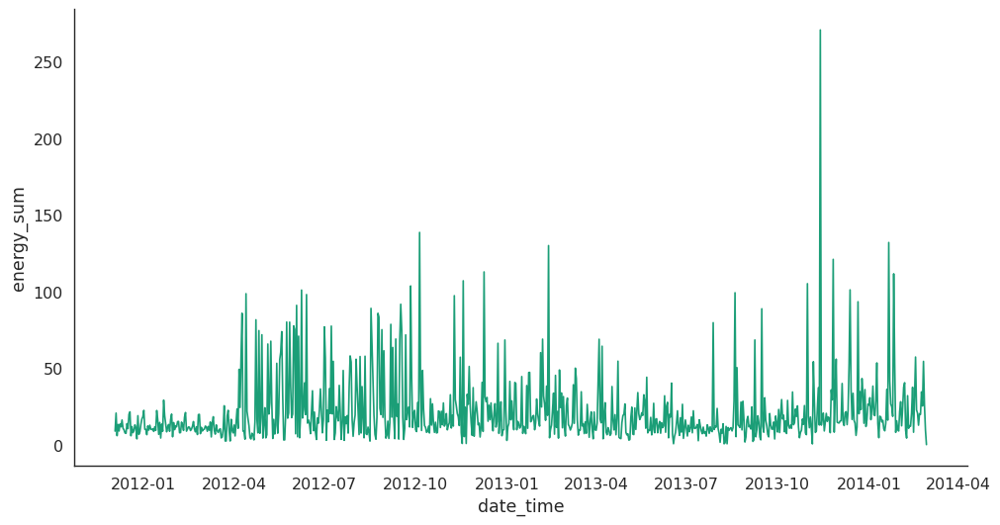

In [ ]:
from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['date_time']
  ys = series['energy_sum']

  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_14.sort_values('date_time', ascending=True)
_plot_series(df_sorted, '')
sns.despine(fig=fig, ax=ax)
plt.xlabel('date_time')
_ = plt.ylabel('energy_sum')

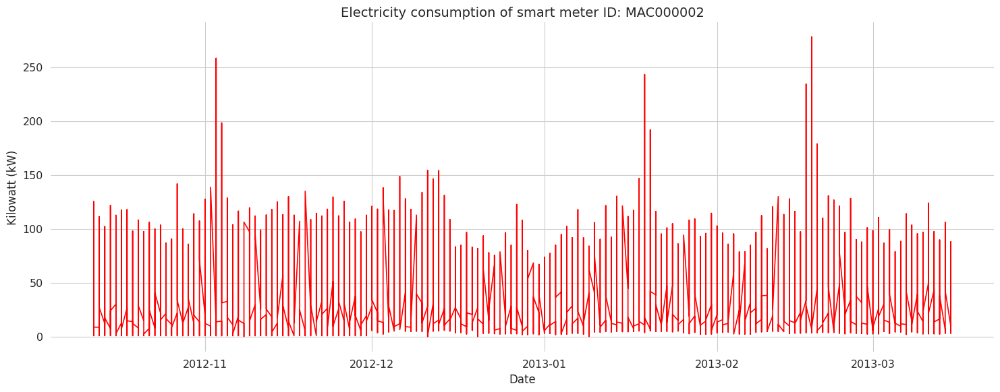

In [ ]:
data1 = data[(data.date_time >= '2012-10-12') & (data.date_time < '2013-03-16')]

plt.figure(figsize=(15,6))
plt.plot(data1.date_time, data1.energy_sum, color='red')
plt.ylabel('Kilowatt (kW)', fontsize=12)
plt.xlabel('Date', fontsize=12)
plt.title('Electricity consumption of smart meter ID: MAC000002', fontsize=14)
plt.tight_layout()
plt.grid(True)
sns.despine(bottom=True, left=True)
plt.show()

Exploring SDG7 Indicators Project


In [ ]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import seaborn as sns #data visualisation
import matplotlib.pyplot as plt #data visualisation
from sklearn.cluster import KMeans #clustering


#for map visualisation
import json
import geopandas as gpd

#for ARIMA model
from statsmodels.tsa.arima.model import ARIMA
#import pmdarima as pm #installation of pmdarima not working on kaggle
#from pmdarima.model_selection import train_test_split

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

df = pd.read_csv("/content/global-data-on-sustainable-energy (1) (1).csv")

In [ ]:
dfproject = df[['Entity', 'Year', 'Access to electricity (% of population)', 'Access to clean fuels for cooking', 'Renewable energy share in the total final energy consumption (%)', 'Energy intensity level of primary energy (MJ/$2017 PPP GDP)', 'Financial flows to developing countries (US $)', 'Renewable-electricity-generating-capacity-per-capita']]
dfproject.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3649 entries, 0 to 3648
Data columns (total 8 columns):
 #   Column                                                            Non-Null Count  Dtype  
---  ------                                                            --------------  -----  
 0   Entity                                                            3649 non-null   object 
 1   Year                                                              3649 non-null   int64  
 2   Access to electricity (% of population)                           3639 non-null   float64
 3   Access to clean fuels for cooking                                 3480 non-null   float64
 4   Renewable energy share in the total final energy consumption (%)  3455 non-null   float64
 5   Energy intensity level of primary energy (MJ/$2017 PPP GDP)       3442 non-null   float64
 6   Financial flows to developing countries (US $)                    1560 non-null   float64
 7   Renewable-electricity-generating-c

In [ ]:
dfproject.describe()

,Year,Access to electricity (% of population),Access to clean fuels for cooking,Renewable energy share in the total final energy consumption (%),Energy intensity level of primary energy (MJ/$2017 PPP GDP),Financial flows to developing countries (US $),Renewable-electricity-generating-capacity-per-capita
count,3649.000000,3639.000000,3480.000000,3455.000000,3442.000000,1.560000e+03,2718.000000
mean,2010.038367,78.933702,63.255287,32.638165,5.307345,9.422400e+07,113.137498
std,6.054228,30.275541,39.043658,29.894901,3.532020,2.981544e+08,244.167256
min,2000.000000,1.252269,0.000000,0.000000,0.110000,0.000000e+00,0.000000
25%,2005.000000,59.800890,23.175000,6.515000,3.170000,2.600000e+05,3.540000
50%,2010.000000,98.361570,83.150000,23.300000,4.300000,5.665000e+06,32.910000
75%,2015.000000,100.000000,100.000000,55.245000,6.027500,5.534750e+07,112.210000
max,2020.000000,100.000000,100.000000,96.040000,32.570000,5.202310e+09,3060.190000


In [ ]:
dfproject.isna().sum()

Entity                                                                 0
Year                                                                   0
Access to electricity (% of population)                               10
Access to clean fuels for cooking                                    169
Renewable energy share in the total final energy consumption (%)     194
Energy intensity level of primary energy (MJ/$2017 PPP GDP)          207
Financial flows to developing countries (US $)                      2089
Renewable-electricity-generating-capacity-per-capita                 931
dtype: int64

In [ ]:
countrylist=[]
countrylist = dfproject['Entity'].unique()
count=0
for country in countrylist:
    count +=1
print(count)

176


Replacing all missing values within entities with the median of he entity and displaying the number of leftover missing values.

In [ ]:
grouped = dfproject.groupby('Entity')
clean = grouped.transform(lambda x: x.fillna(x.median()))
entity = dfproject['Entity']
clean['Entity']=entity
clean.shape
clean.isna().sum()

Year                                                                   0
Access to electricity (% of population)                                1
Access to clean fuels for cooking                                    169
Renewable energy share in the total final energy consumption (%)      21
Energy intensity level of primary energy (MJ/$2017 PPP GDP)           22
Financial flows to developing countries (US $)                      1184
Renewable-electricity-generating-capacity-per-capita                 931
Entity                                                                 0
dtype: int64

Exploring the within country missing obeservations to get a better idea of how to handle them and to see how they are spread across variables.

In [ ]:
nan_c=clean.isna()
nan_c['Entity'] = entity
nan_c
nan = nan_c.groupby('Entity').sum()
nan
subset = nan[(nan != 0).any(axis=1)]
subset

,Year,Access to electricity (% of population),Access to clean fuels for cooking,Renewable energy share in the total final energy consumption (%),Energy intensity level of primary energy (MJ/$2017 PPP GDP),Financial flows to developing countries (US $),Renewable-electricity-generating-capacity-per-capita
Entity,,,,,,,
Albania,0,0,0,21,0,21,21
Aruba,0,0,21,0,0,21,0
Australia,0,0,0,0,0,21,21
Austria,0,0,0,0,0,21,21
Bahrain,0,0,0,0,0,21,0
Belarus,0,0,0,0,0,21,21
Belgium,0,0,0,0,0,21,21
Bermuda,0,0,21,0,0,21,21
Bosnia and Herzegovina,0,0,0,0,0,21,21


The missing data seems to be concentrated for specific variables and countries. Following step is dropping the variables which contain a significant number of missing values and dropping the countries for which there are entirely missing observations for one or more variables of interest.

In [ ]:
clean = clean.drop(columns=["Renewable-electricity-generating-capacity-per-capita","Financial flows to developing countries (US $)"])
todrop = ["Bermuda", "Bulgaria","Aruba", "Albania", "Puerto Rico","New Caledonia", "Libya", "Lebanon", "French Guiana", "Cayman Islands"]
clean = clean[~clean["Entity"].isin(todrop)]
clean.isna().sum()

Year                                                                0
Access to electricity (% of population)                             0
Access to clean fuels for cooking                                   0
Renewable energy share in the total final energy consumption (%)    0
Energy intensity level of primary energy (MJ/$2017 PPP GDP)         0
Entity                                                              0
dtype: int64

Data is clean and ready to cluster.

In [ ]:
dfcluster = clean[clean['Year']==2020]
entity=dfcluster['Entity']
dfcluster = dfcluster.drop(columns=["Year", "Entity"])

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will chang

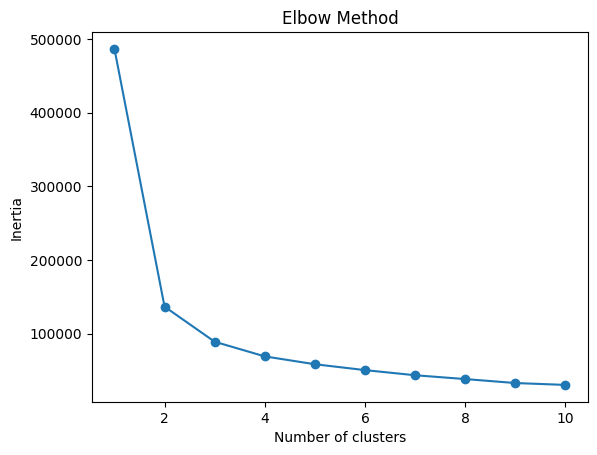

In [ ]:
inertias = []

for i in range(1,11):
    kmeans = KMeans(n_clusters=i)
    kmeans.fit(dfcluster)
    inertias.append(kmeans.inertia_)

plt.plot(range(1,11), inertias, marker='o')
plt.title('Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
plt.show()

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



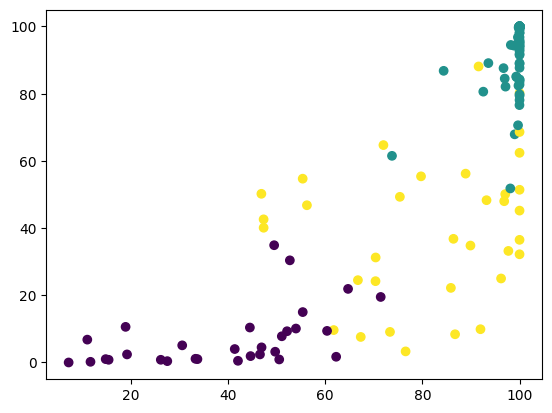

In [ ]:
kmeans=KMeans(n_clusters=3)
kmeans.fit(dfcluster)

plt.scatter(dfcluster['Access to electricity (% of population)'], dfcluster["Access to clean fuels for cooking"], c=kmeans.labels_)

In [ ]:
dfcluster['Labels'] = kmeans.labels_
dfcluster.head()

,Access to electricity (% of population),Access to clean fuels for cooking,Renewable energy share in the total final energy consumption (%),Energy intensity level of primary energy (MJ/$2017 PPP GDP),Labels
20,97.70000,33.2,19.565,2.245,2
62,99.80413,99.7,0.280,4.445,1
83,46.89061,50.2,55.565,2.710,2
104,100.00000,100.0,0.000,3.610,1
125,100.00000,99.9,9.390,3.405,1


In [ ]:
dfcluster['Entity']=entity
dfcluster.shape

(166, 6)

In [ ]:
names=["one","two","three"]
i=0
for name in names:
    print(name + "\n")
    name=dfcluster[dfcluster['Labels']==i]
    i+=1
    name=name.drop(columns='Entity')
    print(name.mean())
    print("next cluster \n")

one

Access to electricity (% of population)                             39.675467
Access to clean fuels for cooking                                    7.266667
Renewable energy share in the total final energy consumption (%)    79.023000
Energy intensity level of primary energy (MJ/$2017 PPP GDP)          7.196896
Labels                                                               0.000000
dtype: float64
next cluster 

two

Access to electricity (% of population)                             99.280592
Access to clean fuels for cooking                                   94.444608
Renewable energy share in the total final energy consumption (%)    15.144755
Energy intensity level of primary energy (MJ/$2017 PPP GDP)          4.823441
Labels                                                               1.000000
dtype: float64
next cluster 

three

Access to electricity (% of population)                             81.447704
Access to clean fuels for cooking                                

In [ ]:
compression_opts = dict(method='zip',
                        archive_name='out.csv')
dfcluster.to_csv('out.zip', index=False,
          compression=compression_opts)

In [ ]:
worldmap = gpd.read_file('/kaggle/input/jsonmap/custom.geo (2).json')
listjsonfile=worldmap["sovereignt"].tolist()
listjsonfile

ERROR:fiona._env:/kaggle/input/jsonmap/custom.geo (2).json: No such file or directory


DriverError: /kaggle/input/jsonmap/custom.geo (2).json: No such file or directory

PROBLEM WITH JSON FILE LINE 19

In [ ]:
!pip install pycountry-convert
!pip install sktime[all_extras]

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.2/6.2 MB 22.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.5/233.5 kB 5.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.9/21.9 MB 19.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 128.8/128.8 kB 9.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 983.0/983.0 kB 26.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.2/10.2 MB 33.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 744.7/744.7 kB 34.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 39.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.3/8.3 MB 28.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.0/49.0 kB 4.8 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import pycountry_convert as pc
import geopandas

In [ ]:
df = pd.read_csv('/content/global-data-on-sustainable-energy (1) (1).csv')

In [ ]:
missing_values_df = df.isnull().sum() / df.shape[0] * 100.00
print(round(missing_values_df),2)

Entity                                                               0.0
Year                                                                 0.0
Access to electricity (% of population)                              0.0
Access to clean fuels for cooking                                    5.0
Renewable-electricity-generating-capacity-per-capita                26.0
Financial flows to developing countries (US $)                      57.0
Renewable energy share in the total final energy consumption (%)     5.0
Electricity from fossil fuels (TWh)                                  1.0
Electricity from nuclear (TWh)                                       3.0
Electricity from renewables (TWh)                                    1.0
Low-carbon electricity (% electricity)                               1.0
Primary energy consumption per capita (kWh/person)                   0.0
Energy intensity level of primary energy (MJ/$2017 PPP GDP)          6.0
Value_co2_emissions_kt_by_country                  

In [ ]:
def country_to_continent(country_name):
    country_alpha2 = pc.country_name_to_country_alpha2(country_name)
    country_continent_code = pc.country_alpha2_to_continent_code(country_alpha2)
    country_continent_name = pc.convert_continent_code_to_continent_name(country_continent_code)
    return country_continent_name

df['Continent'] = df['Entity'].apply(country_to_continent)
df.head(10)

/usr/local/lib/python3.10/dist-packages/pycountry/db.py:51: UserWarning: Country's official_name not found. Country name provided instead.
  warnings.warn(warning_message, UserWarning)
/usr/local/lib/python3.10/dist-packages/pycountry/db.py:51: UserWarning: Country's common_name not found. Country name provided instead.
  warnings.warn(warning_message, UserWarning)


,Entity,Year,Access to electricity (% of population),Access to clean fuels for cooking,Renewable-electricity-generating-capacity-per-capita,Financial flows to developing countries (US $),Renewable energy share in the total final energy consumption (%),Electricity from fossil fuels (TWh),Electricity from nuclear (TWh),Electricity from renewables (TWh),...,Energy intensity level of primary energy (MJ/$2017 PPP GDP),Value_co2_emissions_kt_by_country,Renewables (% equivalent primary energy),gdp_growth,gdp_per_capita,Density\n(P/Km2),Land Area(Km2),Latitude,Longitude,Continent
0,Afghanistan,2000,1.613591,6.20,9.22,20000.0,44.99,0.16,0.0,0.31,...,1.64,760.000000,NaN,NaN,NaN,60,"6,52,230",33.93911,67.709953,Asia
1,Afghanistan,2001,4.074574,7.20,8.86,130000.0,45.60,0.09,0.0,0.50,...,1.74,730.000000,NaN,NaN,NaN,60,"6,52,230",33.93911,67.709953,Asia
2,Afghanistan,2002,9.409158,8.20,8.47,3950000.0,37.83,0.13,0.0,0.56,...,1.40,1029.999971,NaN,NaN,179.426579,60,"6,52,230",33.93911,67.709953,Asia
3,Afghanistan,2003,14.738506,9.50,8.09,25970000.0,36.66,0.31,0.0,0.63,...,1.40,1220.000029,NaN,8.832278,190.683814,60,"6,52,230",33.93911,67.709953,Asia
4,Afghanistan,2004,20.064968,10.90,7.75,NaN,44.24,0.33,0.0,0.56,...,1.20,1029.999971,NaN,1.414118,211.382074,60,"6,52,230",33.93911,67.709953,Asia
5,Afghanistan,2005,25.390894,12.20,7.51,9830000.0,33.88,0.34,0.0,0.59,...,1.41,1549.999952,NaN,11.229715,242.031313,60,"6,52,230",33.93911,67.709953,Asia
6,Afghanistan,2006,30.718690,13.85,7.40,10620000.0,31.89,0.20,0.0,0.64,...,1.50,1759.999990,NaN,5.357403,263.733602,60,"6,52,230",33.93911,67.709953,Asia
7,Afghanistan,2007,36.051010,15.30,7.25,15750000.0,28.78,0.20,0.0,0.75,...,1.53,1769.999981,NaN,13.826320,359.693158,60,"6,52,230",33.93911,67.709953,Asia
8,Afghanistan,2008,42.400000,16.70,7.49,16170000.0,21.17,0.19,0.0,0.54,...,1.94,3559.999943,NaN,3.924984,364.663542,60,"6,52,230",33.93911,67.709953,Asia
9,Afghanistan,2009,46.740050,18.40,7.50,9960000.0,16.53,0.16,0.0,0.78,...,2.25,4880.000114,NaN,21.390528,437.268740,60,"6,52,230",33.93911,67.709953,Asia


In [ ]:
# Creating an empty table df_energy_all with the necessary columns and data types
columns = ['Year', 'Asia', 'Europe', 'Africa', 'North America', 'South America', 'Oceania']
df_energy_all = pd.DataFrame(columns=columns)

# Creating a function to automatically calculate the average value for the continent for the year
def filter_and_calculate_mean(df, year, column_name):
    row_data = {'Year': year}
    for continent in columns[1:]:
        filtered_df = df[(df['Year'] == year) & (df['Continent'] == continent)]
        mean_value = filtered_df[column_name].mean()
        row_data[continent] = mean_value
    return row_data

column_name = 'Primary energy consumption per capita (kWh/person)'
data_to_concat = []

for year in range(2000, 2021):
    row_data = filter_and_calculate_mean(df, year, column_name)
    data_to_concat.append(row_data)

# Putting it all together
df_energy_all = pd.concat([df_energy_all, pd.DataFrame(data_to_concat)], ignore_index=True)

df_energy_all['Year'] = df_energy_all['Year'].astype('int64')

# Displaying the df_energy_all table for review
display(df_energy_all)

,Year,Asia,Europe,Africa,North America,South America,Oceania
0,2000,32603.548770,44338.700471,4847.900957,27566.726344,13934.571591,20410.083500
1,2001,32578.960987,45077.597029,4927.979202,27755.850681,13594.028840,19753.279083
2,2002,33162.266291,45139.789114,5469.067622,28417.839719,13549.300650,19865.650267
3,2003,34514.456805,45684.361743,5504.370569,28567.084826,13544.852940,19749.410967
4,2004,36230.592382,46671.465343,5273.563727,29296.645961,13972.343900,19765.507192
5,2005,37451.074974,46636.735829,5585.993981,29737.698887,14138.375900,19710.961400
6,2006,36457.840863,46652.192029,5678.845593,30871.057922,14445.831080,19167.817408
7,2007,35493.393719,45862.498946,5522.412833,32065.740419,14902.684930,19324.754717
8,2008,35432.366691,46592.391405,5678.256258,31494.962770,15461.434940,19097.807625
9,2009,34366.110954,44063.963243,5791.133308,29676.628769,15278.057450,18727.961067


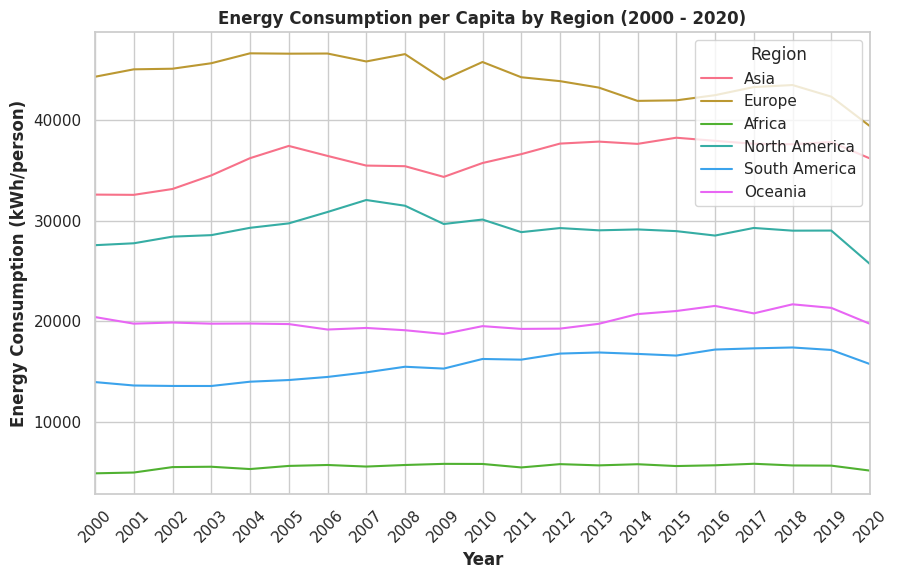

In [ ]:
df_energy_cons_melted = pd.melt(df_energy_all, id_vars='Year', var_name='Region', value_name='Energy Consumption')

# Building a graph
plt.figure(figsize=(10, 6))
sns.set(style='whitegrid')
palette = sns.color_palette("husl", len(df_energy_cons_melted['Region'].unique()))

plot = sns.lineplot(data=df_energy_cons_melted, x='Year', y='Energy Consumption', hue='Region', palette=palette)

# Adding names to the graph
plt.xlabel('Year', fontweight='bold')
plt.ylabel('Energy Consumption (kWh/person)', fontweight='bold')
plt.title('Energy Consumption per Capita by Region (2000 - 2020)', fontweight='bold')
plt.legend(title='Region')
plt.margins(x=0)

# Adjust the placement of captions on the x-axis and change the date format
years = range(2000, 2021)
plot.set_xticks(years)
plot.set_xticklabels([str(year) for year in years], rotation=45)

plt.show()

In [ ]:
columns = ['Year', 'Asia', 'Europe', 'Africa', 'North America', 'South America', 'Oceania']
df_energy_CO2_emission = pd.DataFrame(columns=columns)
df_energy_CO2_emission = df_energy_CO2_emission.dropna()


# Create a function to automatically calculate the average value for the continent for the year
def filter_and_calculate_mean(df, year, column_name):
    row_data = {'Year': year}
    for continent in columns[1:]:
        filtered_df = df[(df['Year'] == year) & (df['Continent'] == continent)]
        mean_value = filtered_df[column_name].mean()
        row_data[continent] = mean_value
    return row_data

column_name = 'Value_co2_emissions_kt_by_country'
data_to_concat = []

for year in range(2000, 2021):
    row_data = filter_and_calculate_mean(df, year, column_name)
    data_to_concat.append(row_data)

# Putting it all together
df_energy_CO2_emission = pd.concat([df_energy_CO2_emission, pd.DataFrame(data_to_concat)], ignore_index=True)

df_energy_CO2_emission['Year'] = df_energy_CO2_emission['Year'].astype('int64')

# Displaying the df_energy_all table for review
df_energy_CO2_emission = df_energy_CO2_emission.dropna()
df_energy_CO2_emission.head(21)

,Year,Asia,Europe,Africa,North America,South America,Oceania
0,2000,201805.277778,126603.235294,14348.695652,308078.301773,61750.000000,31290.266917
1,2001,208948.333333,128810.294118,15378.695652,306658.317091,61452.000000,32024.042083
2,2002,220658.891107,128217.351961,15595.000153,300865.897428,60407.001020,32712.128992
3,2003,240787.781329,132186.175913,16477.826032,305745.388252,60788.000222,32884.936418
4,2004,265491.106977,131827.942219,17234.782442,309414.243751,65088.999582,34035.852299
5,2005,288241.661496,130847.646169,17568.695672,311778.512554,66309.000894,34521.965469
6,2006,309791.950158,131542.645043,17732.826098,307951.550613,67946.998846,34960.908740
7,2007,332571.113818,124481.110461,18092.826034,313789.327207,71615.999588,35763.716803
8,2008,343014.725130,121700.278390,19226.304164,304571.842211,75373.999892,36044.799568
9,2009,359063.883047,111889.999684,18916.304554,284591.068688,72502.000103,36358.495319


In [ ]:
Co2_emission = df_energy_CO2_emission
Co2_emission.head(10)

,Year,Asia,Europe,Africa,North America,South America,Oceania
0,2000,201805.277778,126603.235294,14348.695652,308078.301773,61750.000000,31290.266917
1,2001,208948.333333,128810.294118,15378.695652,306658.317091,61452.000000,32024.042083
2,2002,220658.891107,128217.351961,15595.000153,300865.897428,60407.001020,32712.128992
3,2003,240787.781329,132186.175913,16477.826032,305745.388252,60788.000222,32884.936418
4,2004,265491.106977,131827.942219,17234.782442,309414.243751,65088.999582,34035.852299
5,2005,288241.661496,130847.646169,17568.695672,311778.512554,66309.000894,34521.965469
6,2006,309791.950158,131542.645043,17732.826098,307951.550613,67946.998846,34960.908740
7,2007,332571.113818,124481.110461,18092.826034,313789.327207,71615.999588,35763.716803
8,2008,343014.725130,121700.278390,19226.304164,304571.842211,75373.999892,36044.799568
9,2009,359063.883047,111889.999684,18916.304554,284591.068688,72502.000103,36358.495319


In [ ]:
Co2_emission['Year'] = pd.to_datetime(Co2_emission['Year'], format='%Y')
Co2_emission.set_index('Year', inplace=True)

In [ ]:
#defining forecast DataFrame
forecast_df = Co2_emission.resample('Y').mean()

In [ ]:
from sktime.forecasting.base import ForecastingHorizon
from sklearn.metrics import mean_absolute_error, mean_squared_error
from sktime.performance_metrics.forecasting import mean_squared_error
from sktime.forecasting.arima import AutoARIMA

In [ ]:
def calculate_scores(y_true, y_pred):
    mae = mean_absolute_error(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    return mae, mse, rmse

# forecasting and visualization
def sktime_forecast(dataset, horizon, forecaster, validation=False, confidence=0.90, frequency="Y"):

    # Adjusting frequency and interpolate missing values
    forecast_df = dataset.resample(rule=frequency).sum()
    forecast_df = forecast_df.interpolate(method="time")

    for col in dataset.columns:
        if validation:
            # Validation scenario
            df = forecast_df[col]

            y_train = df[:-horizon]
            y_test = df.tail(horizon)

            forecaster.fit(y_train)
            fh = ForecastingHorizon(y_test.index, is_relative=False)
            y_pred = forecaster.predict(fh)
            ci = forecaster.predict_interval(fh, coverage=confidence).astype("float")
            y_true = df.tail(horizon)

            mae, mse, rmse = calculate_scores(y_true, y_pred)
        else:
            # Non-validation scenario
            df = forecast_df[col].dropna()
            forecaster.fit(df)

            last_date = df.index.max()
            fh = ForecastingHorizon(
                pd.date_range(str(last_date), periods=horizon, freq=frequency),
                is_relative=False,
            )

            y_pred = forecaster.predict(fh)
            ci = forecaster.predict_interval(fh, coverage=confidence).astype("float")

            if not np.isnan(y_pred).any():
                y_true = df.tail(horizon)
                mae, mse, rmse = calculate_scores(y_true, y_pred)
            else:
                mae, mse, rmse = np.nan, np.nan, np.nan

        # Plot and display results
        plt.plot(
            df.tail(horizon * 3),
            label="Actual",
            color="black",
        )
        plt.gca().fill_between(
            ci.index, (ci.iloc[:, 0]), (ci.iloc[:, 1]), color="b", alpha=0.1
        )
        plt.plot(y_pred, label="Predicted")
        plt.title( f"{horizon} years forecast for {col}, confidence: {confidence*100}%)")
        plt.ylim(bottom=0)
        plt.legend()
        plt.grid(True)
        plt.show()

        # Display scores
        print(f"Column Name: {col}")
        print(f"Actual Values: {y_true.to_numpy()}")
        print(f"Predicted Values: {y_pred.to_numpy()}")
        print(f"Confidence Interval: {ci.to_numpy()}")
        print(f"Mean Absolute Error (MAE): {mae}")
        print(f"Mean Squared Error (MSE): {mse}")
        print(f"Root Mean Squared Error (RMSE): {rmse}")
        print(f"Confidence Level: {confidence}\n")

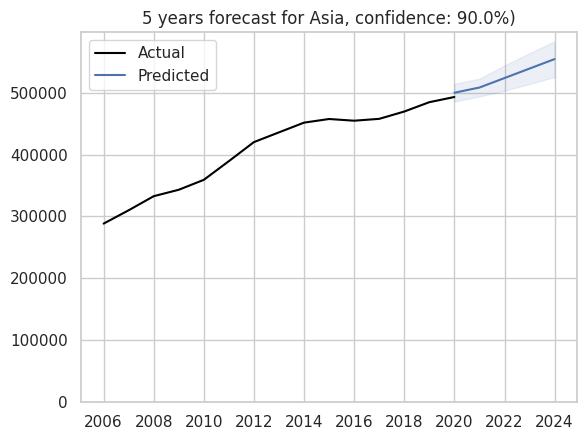

Column Name: Asia
Actual Values: [454687.48764941 457688.61630645 469512.49106613 484632.48990239
 493007.49410722]
Predicted Values: [499958.92234078 508333.92654561 523660.35898401 538986.7914224
 554313.22386079]
Confidence Interval: [[485564.95364087 514352.89104069]
 [493939.9578457  522727.89524553]
 [503304.21323222 544016.5047358 ]
 [514055.70631159 563917.8765332 ]
 [525525.28646096 583101.16126062]]
Mean Absolute Error (MAE): 53144.92882439713
Mean Squared Error (MSE): 2851844888.5266714
Root Mean Squared Error (RMSE): 53402.66742894657
Confidence Level: 0.9



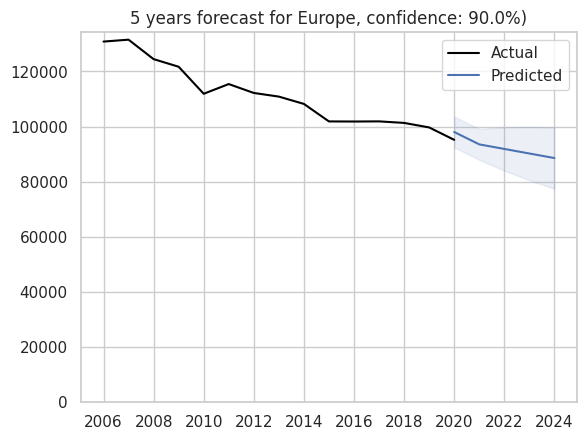

Column Name: Europe
Actual Values: [101808.60992372 101859.72240417 101303.88899175  99660.83429811
  95159.44463878]
Predicted Values: [98005.89794783 93504.5082885  91849.57193822 90194.63558793
 88539.69923765]
Confidence Interval: [[ 92412.25848046 103599.5374152 ]
 [ 87910.86882113  99098.14775587]
 [ 83938.97114043  99760.172736  ]
 [ 80506.16783123  99883.10334464]
 [ 77352.42030291  99726.97817239]]
Mean Absolute Error (MAE): 7539.637451279414
Mean Squared Error (MSE): 61416855.88705699
Root Mean Squared Error (RMSE): 7836.890702763245
Confidence Level: 0.9



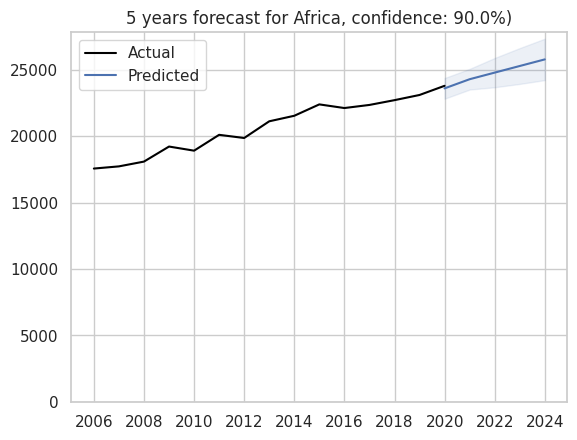

Column Name: Africa
Actual Values: [22127.02134412 22360.85152414 22720.63805063 23110.8509793
 23801.0642264 ]
Predicted Values: [23608.34406215 24298.55730925 24796.05039211 25293.54347496
 25791.03655781]
Confidence Interval: [[22828.85039736 24387.83772694]
 [23519.06364446 25078.05097404]
 [23693.67987957 25898.42090464]
 [23943.42084336 26643.66610656]
 [24232.04922823 27350.0238874 ]]
Mean Absolute Error (MAE): 1933.42113433899
Mean Squared Error (MSE): 3796098.700433966
Root Mean Squared Error (RMSE): 1948.3579497705152
Confidence Level: 0.9



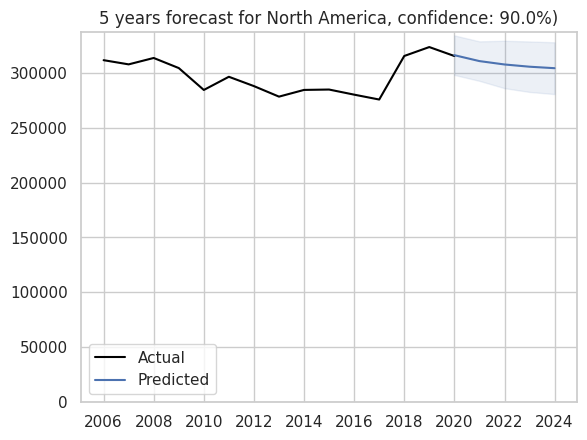

Column Name: North America
Actual Values: [280328.32548171 275861.02427385 315604.21682854 323750.53117433
 315594.74872634]
Predicted Values: [316350.00584163 310944.12885254 307861.57005194 305818.36527129
 304464.07292986]
Confidence Interval: [[298320.71728755 334379.29439571]
 [292914.84029846 328973.41740662]
 [286231.3800745  329491.76002938]
 [282783.45150303 328853.27903955]
 [280838.40043369 328089.74542602]]
Mean Absolute Error (MAE): 21582.05468294809
Mean Squared Error (MSE): 606757755.9199897
Root Mean Squared Error (RMSE): 24632.45330696863
Confidence Level: 0.9



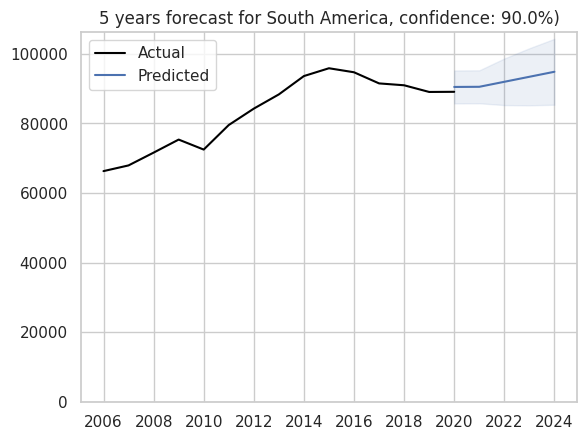

Column Name: South America
Actual Values: [94723.0005525 91520.9990326 90981.9995104 89062.9980771 89104.9998299]
Predicted Values: [90502.73491025 90544.73666305 91984.47349621 93424.21032936
 94863.94716251]
Confidence Interval: [[ 85766.73433597  95238.73548453]
 [ 85808.73608877  95280.73723733]
 [ 85286.75725265  98682.18973976]
 [ 85221.21671003 101627.20394868]
 [ 85391.94601395 104335.94831107]]
Mean Absolute Error (MAE): 3263.832316493694
Mean Squared Error (MSE): 14390866.217314173
Root Mean Squared Error (RMSE): 3793.5295197631153
Confidence Level: 0.9



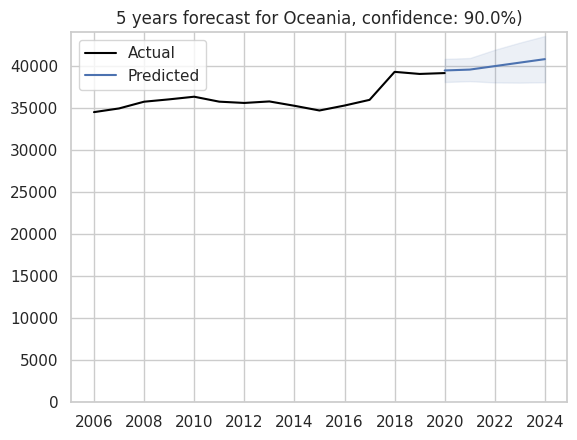

Column Name: Oceania
Actual Values: [35305.20156633 35984.84513301 39320.90946628 39072.72798598
 39176.36336882]
Predicted Values: [39487.78569399 39591.42107683 40006.47878484 40421.53649284
 40836.59420085]
Confidence Interval: [[38109.61022742 40865.96116057]
 [38213.24561025 40969.5965434 ]
 [38057.44434867 41955.513221  ]
 [38034.46656299 42808.6064227 ]
 [38080.2432677  43592.945134  ]]
Mean Absolute Error (MAE): 2296.7537457850704
Mean Squared Error (MSE): 7109411.223562387
Root Mean Squared Error (RMSE): 2666.3479187012313
Confidence Level: 0.9



In [ ]:
forecaster = AutoARIMA(sp=1, suppress_warnings=True)
sktime_forecast(dataset=Co2_emission, horizon=5, forecaster=forecaster, validation=False)

Analysis for Asia:

High MAE and RMSE (53,144.93 and 53,402.67, respectively).
Wide confidence intervals, indicating significant uncertainty.
Model predictions have relatively large errors.
Analysis for Europe:

Moderate MAE and RMSE (7,539.64 and 7,836.89, respectively).
Narrow confidence intervals, which indicates high reliability of the forecast.
The model provides relatively accurate forecasts for European data.
Analysis for Africa:

Low MAE and RMSE (1.933.42 and 1.948.36, respectively).
Narrow confidence intervals, which indicates high reliability of the forecast.
The model performs well with low forecast errors in the African region.
Analysis for North America:

Moderate MAE and RMSE (21,582.05 and 24,632.45, respectively).
Wide confidence intervals, indicating some uncertainty in the forecast.
Model accuracy is moderate, with room for improvement.
Analysis for South America:

Low MAE and RMSE values (3,263.83 and 3,793.53, respectively).
Narrow confidence intervals, which indicates high reliability of the forecast.
The model provides accurate forecasts with low errors in South America.
Analysis for Oceania:

Low MAE and RMSE (2,296.75 and 2,666.35, respectively).
Narrow confidence intervals, which indicates high reliability of the forecast.
The model performs well with low forecast errors in Oceania.
Overall conclusion

Overall, the models for Europe, Africa, South America, and Oceania perform relatively well with smaller errors and higher forecast confidence. In contrast, the models for Asia and North America have higher errors and wider confidence intervals, indicating that there is room for improvement in accuracy and reliability.

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

from prophet import Prophet
from prophet.diagnostics import performance_metrics
from sklearn.metrics import mean_absolute_percentage_error

In [ ]:
df = pd.read_csv("/content/ontario_electricity_demand.csv", parse_dates=['date'])

def create_features(df):
    return (df
    .assign(
        year = df.date.dt.year,
        quarter = df.date.dt.quarter,
        month = df.date.dt.month,
        day_of_week = df.date.dt.day_of_week,
        day_of_month = df.date.dt.day,
        #week_of_year = df.date.dt.weekofyear,
        month_year = df.date.dt.to_period("M").dt.to_timestamp()
     )
    .set_index(df['date'] + pd.to_timedelta(df['hour'], unit='hour'))
    )

df = create_features(df)
df.head()

,date,hour,hourly_demand,hourly_average_price,year,quarter,month,day_of_week,day_of_month,month_year
2002-05-01 01:00:00,2002-05-01,1,14137000,22.97,2002,2,5,2,1,2002-05-01
2002-05-01 02:00:00,2002-05-01,2,13872000,23.27,2002,2,5,2,1,2002-05-01
2002-05-01 03:00:00,2002-05-01,3,13820000,24.54,2002,2,5,2,1,2002-05-01
2002-05-01 04:00:00,2002-05-01,4,13744000,15.17,2002,2,5,2,1,2002-05-01
2002-05-01 05:00:00,2002-05-01,5,14224000,23.59,2002,2,5,2,1,2002-05-01


In [ ]:
df_pre2023 = df.query("year < 2023").copy()

In [ ]:
sns.set_theme(
        rc = {'lines.color':'#FF6000',
             'axes.facecolor': '#E9EAEC',
             'figure.facecolor':'#E9EAEC',
              'axes.edgecolor':'#333652',
              'text.color':'#333652',
              'xtick.labelcolor': '#333652',
              'ytick.labelcolor': '#333652',
              'axes.titlecolor': '#333652',
              'axes.labelcolor': '#333652',
              'axes.titleweight': 'bold',
             'font.serif':'Utopia'}
)

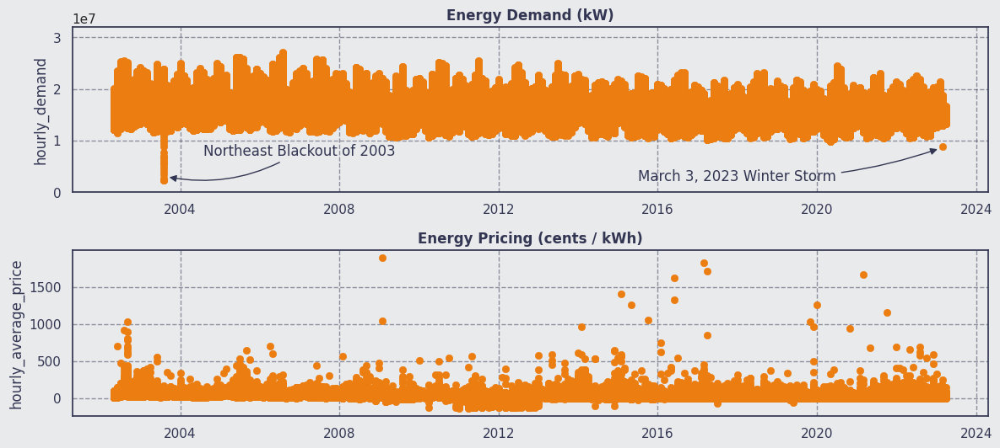

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(14, 6))
plt.subplots_adjust(hspace=0.35)

ax1 = sns.scatterplot(data=df, x='month_year', y='hourly_demand',color='#EC7D10', edgecolor='#EC7D10', ax=ax1)
ax1.set_title('Energy Demand (kW)')
ax1.set_ylim(0, 3.2e+7)

# Northeast Blackout of 2003
ax1.annotate(xy = (pd.to_datetime('2003-09-01'),0.3e+7),  xytext=(pd.to_datetime('2007-01-01'),0.8e+7), text='Northeast Blackout of 2003',
             color='#333652',
            va="center", ha="center", arrowprops=dict(arrowstyle="-|>", connectionstyle="arc3,rad=-0.2", color='#333652', linewidth=1))

# March 3, 2023 Winter Storm
ax1.annotate(xy = (pd.to_datetime('2023-02-01'),0.85e+7),  xytext=(pd.to_datetime('2018-01-01'),0.3e+7), text='March 3, 2023 Winter Storm',
             color='#333652',
            va="center", ha="center", arrowprops=dict(arrowstyle="-|>", connectionstyle="arc3,rad=0.1", color='#333652', linewidth=1))

ax2 = sns.scatterplot(data=df, x='month_year', y='hourly_average_price', color='#EC7D10', edgecolor='#EC7D10', ax=ax2)
ax2.set_title('Energy Pricing (cents / kWh)')

for ax in (ax1, ax2):
    ax.set_xlabel('')
    ax.grid(color='#333652', linestyle='--', alpha=0.5)
    ax.set_axisbelow(True)

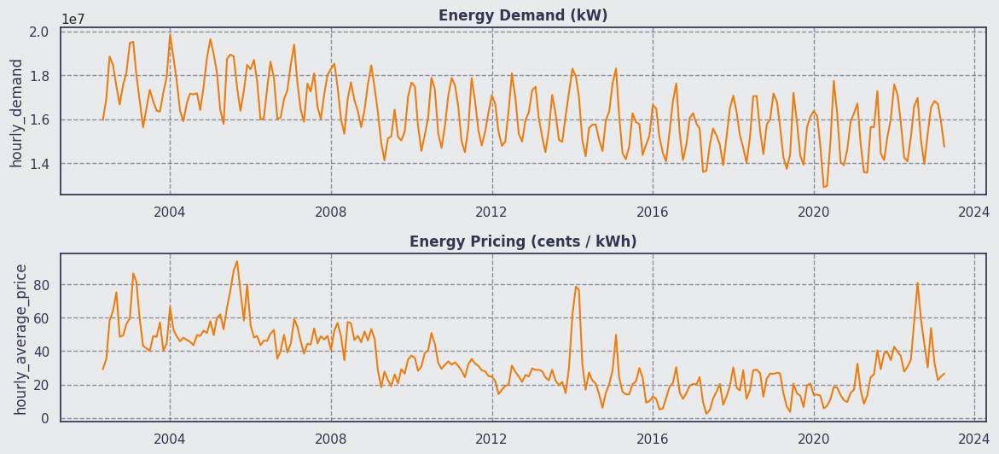

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(14, 6))
plt.subplots_adjust(hspace=0.35)

ax1 = sns.lineplot(data=df, x='month_year', y='hourly_demand', errorbar=None, color='#EC7D10', ax=ax1)
ax1.set_title('Energy Demand (kW)')

ax2 = sns.lineplot(data=df, x='month_year', y='hourly_average_price', color='#EC7D10', errorbar=None, ax=ax2)
ax2.set_title('Energy Pricing (cents / kWh)')

for ax in (ax1, ax2):
    ax.set_xlabel('')
    ax.grid(color='#333652', linestyle='--', alpha=0.5)
    ax.set_axisbelow(True)

In [ ]:
def plot_heatmap(df, time_var, value_name, ax):
    ax = sns.heatmap(df.groupby(['year', time_var], as_index=False)[value_name].mean()\
                              .pivot(columns=time_var, index='year', values=value_name).sort_index(ascending=False), ax=ax)
    return ax

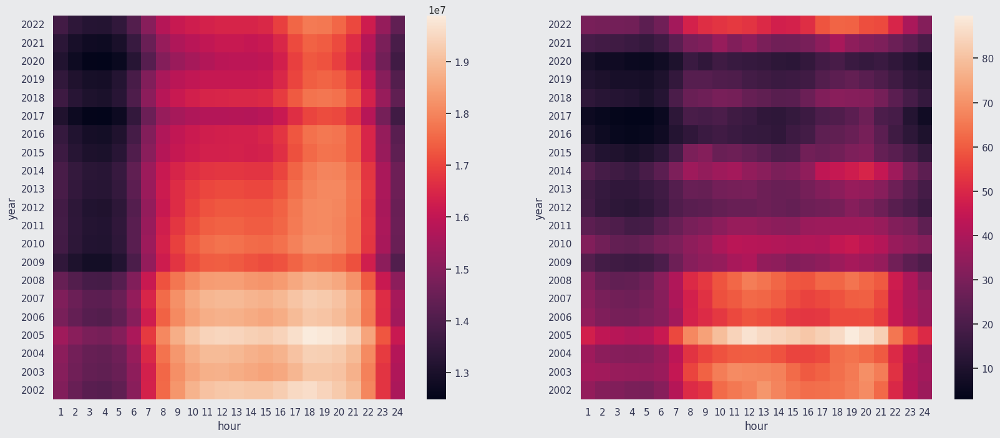

In [ ]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 8))

ax1 = plot_heatmap(df_pre2023, 'hour', 'hourly_demand', ax1)

ax2 = plot_heatmap(df_pre2023, 'hour', 'hourly_average_price', ax2)

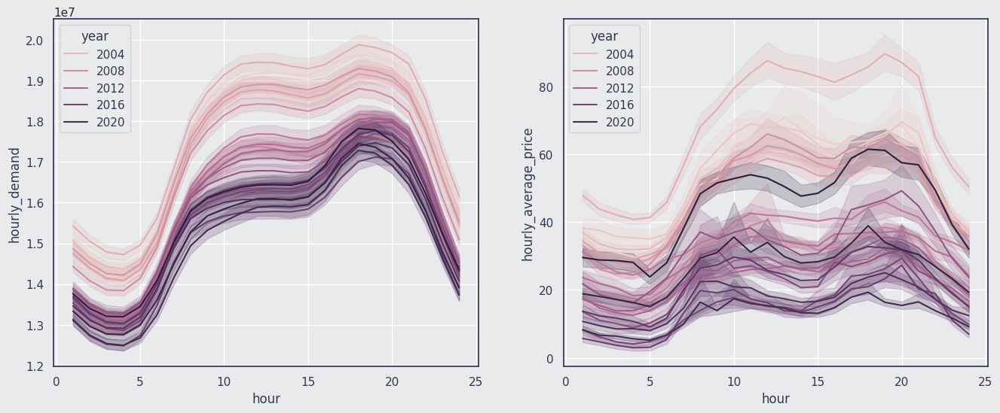

In [ ]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))
ax1 = sns.lineplot(data=df_pre2023, x='hour', y='hourly_demand', hue='year', ax=ax1)

ax2 = sns.lineplot(data=df_pre2023, x='hour', y='hourly_average_price', hue='year', ax=ax2)

In [ ]:
import pandas as pd

# Load the data into a Pandas DataFrame
df = pd.read_csv("/content/ontario_electricity_demand.csv", parse_dates=["date"])

# Explore the first few rows of the data
print(df.head())

# Basic statistics of the data
print(df.describe())

# Check for missing values
print(df.isnull().sum())

        date  hour  hourly_demand  hourly_average_price
0 2002-05-01     1       14137000                 22.97
1 2002-05-01     2       13872000                 23.27
2 2002-05-01     3       13820000                 24.54
3 2002-05-01     4       13744000                 15.17
4 2002-05-01     5       14224000                 23.59
                      date           hour  hourly_demand  hourly_average_price
count               183432  183432.000000   1.834320e+05         183432.000000
mean   2012-10-16 00:00:00      12.500000   1.624913e+07             33.812201
min    2002-05-01 00:00:00       1.000000   2.270000e+06           -138.790000
25%    2007-07-24 00:00:00       6.750000   1.430700e+07             14.380000
50%    2012-10-16 00:00:00      12.500000   1.614600e+07             29.755000
75%    2018-01-09 00:00:00      18.250000   1.803900e+07             43.090000
max    2023-04-03 00:00:00      24.000000   2.700500e+07           1891.140000
std                    NaN      

In [ ]:
# Set 'Date' as the DataFrame index
df.set_index('date', inplace=True)

# Handle missing values (if any)
df.fillna(method='ffill', inplace=True)

In [ ]:
window = 7  # Define the window size for the moving average
df['Forecast'] = df['hourly_demand'].rolling(window=window, min_periods=1).mean()

In [ ]:
import plotly.graph_objects as go

# Create Plotly figure
fig = go.Figure()

# Original energy demand
fig.add_trace(go.Scatter(x=df.index, y=df['hourly_demand'], mode='lines', name='Actual Demand'))

# Forecasted energy demand
fig.add_trace(go.Scatter(x=df.index, y=df['Forecast'], mode='lines', name='Forecasted Demand'))

# Customize the layout
fig.update_layout(title='Energy Demand Forecasting',
                  xaxis_title='Date',
                  yaxis_title='Energy Demand',
                  legend_title='Legend',
                  showlegend=True)

# Display the interactive Plotly chart
fig.show()

In [ ]:
import pandas as pd
import numpy as np

In [ ]:
#Import block & house info data, rename columns
#files = ['block_0.csv']
#block_0 = pd.concat([pd.read_csv("/content/block_0.csv" + f, dtype=str) for f in files])
#house_info = pd.read_csv('/content/informations_households.csv')
#block_0.columns = ['LCLid','DateTime','KWh']

# Load the two CSV datasets
block_0 = pd.read_csv('/content/block_0.csv')
house_info = pd.read_csv('/content/informations_households.csv')
block_0.columns = ['LCLid','DateTime','KWh']


# Concatenate the datasets
#combined_df = pd.concat([df1, df2])

# Write the concatenated dataset to a new CSV file
#combined_df.to_csv('combined_dataset.csv', index=False)


In [ ]:
DateTime = block_0.iloc[:, 1].values
Year = np.zeros(len(DateTime), dtype=int)
Month = np.zeros(len(DateTime), dtype=int)
Day = np.zeros(len(DateTime), dtype=int)
Hour = np.zeros(len(DateTime), dtype=float)
for i in range(0,len(DateTime)):
    Year[i] = (DateTime[i][0:4])
    Month[i] = (DateTime[i][5:7])
    Day[i] = (DateTime[i][8:10])
    if DateTime[i][14:16]=='00':
        Hour[i] = DateTime[i][11:13]
    else:
        Hour[i] = DateTime[i][11:13]
        Hour[i] += 0.5

block_0.loc[:,'Day']=Day
block_0.loc[:,'Month']=Month
block_0.loc[:,'Year']=Year
block_0.loc[:,'Hour']=Hour
#block_0 = block_0.drop('DateTime',1)

In [ ]:
#LCLids where a miss catagorisation has occured i.e. when Acorn == ACORN- in this insatnce
LCLids_del = house_info.loc[house_info.Acorn == 'ACORN-'].LCLid.values
LCLids_del

array(['MAC001074', 'MAC005492'], dtype=object)

In [ ]:
#Delete these houses from the current block being analysed
for i in range (0,len(LCLids_del)):
    if any(block_0.LCLid == LCLids_del[i]):
        block_0 = block_0.loc [block_0.LCLid != LCLids_del[i]]
        print(i)

In [ ]:
block_0_info = pd.merge(block_0, house_info)
block_0_info = block_0_info.drop('Acorn_grouped', axis=1)
block_0_info = block_0_info.drop('file', axis=1)
block_0_info['Acorn'] = block_0_info['Acorn'].str.replace('ACORN-', '')
print(block_0_info.columns)



Index(['LCLid', 'DateTime', 'KWh', 'Day', 'Month', 'Year', 'Hour', 'stdorToU',
       'Acorn'],
      dtype='object')


In [ ]:
# Convert 'Acorn' and 'KWh' columns to numeric
#block_0_info.loc[:, 'Acorn'] = pd.to_numeric(block_0_info['Acorn'], errors='coerce')
#block_0_info.loc[:, 'KWh'] = pd.to_numeric(block_0_info['KWh'], errors='coerce')

# Remove rows with missing values in 'KWh' column
#block_0_info = block_0_info.dropna(subset=['KWh'])

# Perform operations
test_1 = block_0_info.groupby(['Acorn', 'Year', 'Month']).mean().drop(['Day', 'Hour'], axis=1).reset_index()
Years = test_1.Year.unique()
Months = test_1.Month.unique()
for yr in Years: print(yr,':\n',(test_1.loc[test_1.Year == yr]).count())

In [ ]:
#keep 2012 and 2013, reset index with drop=False
block_0_info_2012_2013 = block_0_info.loc[(block_0_info.Year == 2012) | (block_0_info.Year == 2013)].reset_index(drop=False)

In [ ]:
import datetime


DayOfWeek = []
DayOfYear = []
for i in range(0,len(block_0_info_2012_2013)):
    DayOfWeek.append(datetime.datetime(block_0_info_2012_2013.Year[i],
                                       block_0_info_2012_2013.Month[i],
                                       block_0_info_2012_2013.Day[i]).weekday())
    DayOfYear.append(datetime.date(block_0_info_2012_2013.Year[i],
                                       block_0_info_2012_2013.Month[i],
                                       block_0_info_2012_2013.Day[i]).timetuple()[7])
#put in new column
block_0_info_2012_2013['DayOfWeek'] = DayOfWeek
block_0_info_2012_2013['DayOfYear'] = DayOfYear

#create weekend flag, days 5 and 6 are Sat and Sun
block_0_info_2012_2013['Weekend'] = ""
tmp = block_0_info_2012_2013[(block_0_info_2012_2013.DayOfWeek == 5) | (block_0_info_2012_2013.DayOfWeek == 6)].index
block_0_info_2012_2013['Weekend'][tmp] = 1
tmp = block_0_info_2012_2013[block_0_info_2012_2013.Weekend != 1] .index
block_0_info_2012_2013['Weekend'][tmp] = 0

<ipython-input-31-27a629a820f7>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  block_0_info_2012_2013['Weekend'][tmp] = 1
<ipython-input-31-27a629a820f7>:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  block_0_info_2012_2013['Weekend'][tmp] = 0


In [ ]:
block_0_info_2012_2013['AcornDescription'] = ""
AcornName = pd.DataFrame({'Acorn':['A','B','C','D','E','F','G','H','I','J','K','L','M','N','O','P','Q','U'],
                           'AcornName':['Lavish Lifestyles','Executive Wealth','Mature Money',
                                        'City Sophisticates','Career Climbers','Countryside Communities',
                                        'Successful Suburbs','Steady Neighbourhoods','Comfortable Seniors',
                                        'Starting Out','Student Life','Modest Means','Striving Families',
                                        'Poorer Pensioners','Young Hardship','Struggling Estates',
                                        ' Difficult Circumstances','Unknown']})
AcornDesc = pd.read_csv('/content/Acorn Descriptions v2.csv')
AcornDesc = pd.merge(AcornName,AcornDesc)
# Convert the column 'Acorn' in block_0_info_2012_2013 to the same data type as in AcornDesc
block_0_info_2012_2013['Acorn'] = block_0_info_2012_2013['Acorn'].astype(str)

# Now, merge the DataFrames
block_0_info_2012_2013_wkend_desc = pd.merge(block_0_info_2012_2013, AcornDesc)


In [ ]:
%%HTML
<div class='tableauPlaceholder' id='viz1512990824106' style='position: relative'><noscript><a href='#'><img alt='Overview ' src='https:&#47;&#47;public.tableau.com&#47;static&#47;images&#47;Sm&#47;SmartMeters_1&#47;Overview&#47;1_rss.png' style='border: none' /></a></noscript><object class='tableauViz'  style='display:none;'><param name='host_url' value='https%3A%2F%2Fpublic.tableau.com%2F' /> <param name='embed_code_version' value='3' /> <param name='site_root' value='' /><param name='name' value='SmartMeters_1&#47;Overview' /><param name='tabs' value='no' /><param name='toolbar' value='yes' /><param name='static_image' value='https:&#47;&#47;public.tableau.com&#47;static&#47;images&#47;Sm&#47;SmartMeters_1&#47;Overview&#47;1.png' /> <param name='animate_transition' value='yes' /><param name='display_static_image' value='yes' /><param name='display_spinner' value='yes' /><param name='display_overlay' value='yes' /><param name='display_count' value='yes' /></object></div>                <script type='text/javascript'>                    var divElement = document.getElementById('viz1512990824106');                    var vizElement = divElement.getElementsByTagName('object')[0];                    vizElement.style.width='100%';vizElement.style.height=(divElement.offsetWidth*0.75)+'px';                    var scriptElement = document.createElement('script');                    scriptElement.src = 'https://public.tableau.com/javascripts/api/viz_v1.js';                    vizElement.parentNode.insertBefore(scriptElement, vizElement);                </script>

In [ ]:
%%HTML
<div class='tableauPlaceholder' id='viz1512991679641' style='position: relative'><noscript><a href='#'><img alt='Uncertainty ' src='https:&#47;&#47;public.tableau.com&#47;static&#47;images&#47;Sm&#47;SmartMeters_1_2&#47;Uncertainty&#47;1_rss.png' style='border: none' /></a></noscript><object class='tableauViz'  style='display:none;'><param name='host_url' value='https%3A%2F%2Fpublic.tableau.com%2F' /> <param name='embed_code_version' value='3' /> <param name='site_root' value='' /><param name='name' value='SmartMeters_1_2&#47;Uncertainty' /><param name='tabs' value='no' /><param name='toolbar' value='yes' /><param name='static_image' value='https:&#47;&#47;public.tableau.com&#47;static&#47;images&#47;Sm&#47;SmartMeters_1_2&#47;Uncertainty&#47;1.png' /> <param name='animate_transition' value='yes' /><param name='display_static_image' value='yes' /><param name='display_spinner' value='yes' /><param name='display_overlay' value='yes' /><param name='display_count' value='yes' /><param name='filter' value='publish=yes' /></object></div>                <script type='text/javascript'>                    var divElement = document.getElementById('viz1512991679641');                    var vizElement = divElement.getElementsByTagName('object')[0];                    vizElement.style.width='100%';vizElement.style.height=(divElement.offsetWidth*0.75)+'px';                    var scriptElement = document.createElement('script');                    scriptElement.src = 'https://public.tableau.com/javascripts/api/viz_v1.js';                    vizElement.parentNode.insertBefore(scriptElement, vizElement);                </script>

In [ ]:
%%HTML
<div class='tableauPlaceholder' id='viz1512991980407' style='position: relative'><noscript><a href='#'><img alt='TimeOfDay and DayOfYear ' src='https:&#47;&#47;public.tableau.com&#47;static&#47;images&#47;Sm&#47;SmartMeters_1_3&#47;TimeOfDayandDayOfYear&#47;1_rss.png' style='border: none' /></a></noscript><object class='tableauViz'  style='display:none;'><param name='host_url' value='https%3A%2F%2Fpublic.tableau.com%2F' /> <param name='embed_code_version' value='3' /> <param name='site_root' value='' /><param name='name' value='SmartMeters_1_3&#47;TimeOfDayandDayOfYear' /><param name='tabs' value='no' /><param name='toolbar' value='yes' /><param name='static_image' value='https:&#47;&#47;public.tableau.com&#47;static&#47;images&#47;Sm&#47;SmartMeters_1_3&#47;TimeOfDayandDayOfYear&#47;1.png' /> <param name='animate_transition' value='yes' /><param name='display_static_image' value='yes' /><param name='display_spinner' value='yes' /><param name='display_overlay' value='yes' /><param name='display_count' value='yes' /><param name='filter' value='publish=yes' /></object></div>                <script type='text/javascript'>                    var divElement = document.getElementById('viz1512991980407');                    var vizElement = divElement.getElementsByTagName('object')[0];                    vizElement.style.width='100%';vizElement.style.height=(divElement.offsetWidth*0.75)+'px';                    var scriptElement = document.createElement('script');                    scriptElement.src = 'https://public.tableau.com/javascripts/api/viz_v1.js';                    vizElement.parentNode.insertBefore(scriptElement, vizElement);                </script>